In [51]:
# data manipulation:
import pandas as pd
import numpy as np

# stats:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from scipy import stats
import math

# plotting and images:
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import Image

---
## About the data:
Chapter 8 deals with the relationship between variables (correlation, R-squared values, linear regression, etc). 

From all of the cases explored in this chapter, we choose to focus on the Bernie Madoff ponzi scheme. As the story goes, Madoff collected some 8 billion dollars from his investors over the course of 17 years and inflated his yearly returns to show the fund had amassed almost 65 billion by the time his lie had been uncovered.

From the many tools people used to analyse Madoff's unusual long streak of successful yearly returns, we will focus on the "Treynor Ratio", whis is given by:

$$T = \frac{\text{(average yearly returns of the fund) - (risk free returns)}}{\beta}$$

where:
$$\text{risk free returns = treasury bill returns }  (4\%)$$
$$\beta = \text{slope of the "line of best fit" between the fund or stock under analysis, and a market index (such as the S&P 500)}$$

A larger $\beta$ means the stock is more sensitive to market changes, since its performance would be more strongly correlated with that of the index. In other words, if the line of best fit between $x = \text{average yearly fund/stock returns}$ and $y = \text{average yearly index performance}$ returns a high $R^{2}$, then by taking the square root of the $R^{2}$ value, we arrive at the correlation between the variables.

In short, what the Treynor ratio is a measure of risk-adjusted return, and can be explained as the **excess returns earned by the fund (or stock) per unit of market risk.** Typically, a Treynor ratio of $0.21$ is considered incredibly good. 

How good was Madoff's ratio?

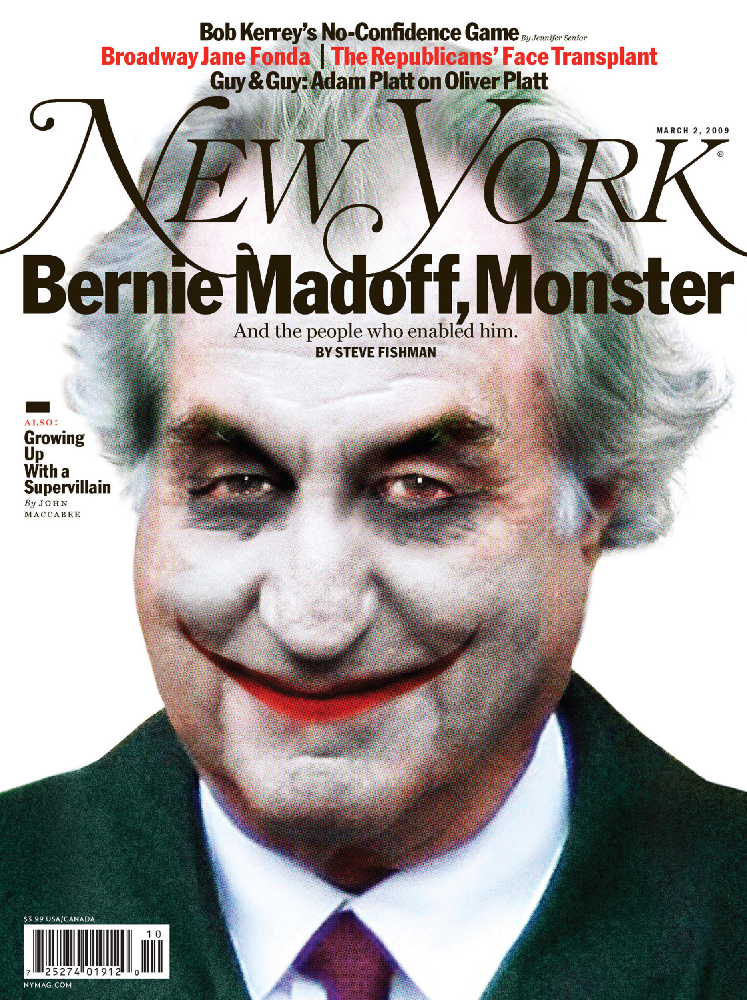

In [53]:
Image(filename='./images/bernie.png', width=500)

---
### Analysis:
In the original dataset given by the author of the book, we are given the yearly returns for the S&P 500, as well as the Madoff fund for the years **1991 - 2007**. I have enriched it by adding the yearly returns for Apple (AAPL) and Disney (DIS), for comparison.

The steps we will take are as follows:
1. we will begin by fitting a "line of best fit" to each stock/fund using the yearly returns of the S&P 500 as the independent variale. 
2. we will extract the slope of the line for each fit ($\beta$)
3. we will use the average of the yearly returns for each fund/stock, the S&P 500, and the $\beta$ value obtained from (2) and we will calculate the Treynor ratio.

As we will see, the high value of the Treynor ratio for the Madoff fund point to the presence of foul play, especially when compared against other stocks.

---
#### Data:

In [2]:
# load the dataset:
madoff_df = pd.read_excel("MadoffBeta.xlsx", sheet_name='Sheet1', header=4).iloc[0:17,:5]
madoff_df['Year'] = madoff_df['Year'].astype(int)
madoff_df['AAPL'] = madoff_df['AAPL'].astype(float)
madoff_df

,Year,SandP,Madoff,AAPL,DIS
0,1991,0.3023,0.176365,0.3110,0.1281
1,1992,0.0749,0.137134,0.0599,0.5022
2,1993,0.0997,0.107497,-0.5105,-0.0087
3,1994,0.0133,0.105529,0.3333,0.0792
4,1995,0.3720,0.120273,-0.1827,0.2799
5,1996,0.2268,0.120743,-0.3451,0.1847
6,1997,0.3310,0.131212,-0.3713,0.4194
7,1998,0.2834,0.125295,2.1190,-0.0909
8,1999,0.2089,0.132771,1.5115,-0.0250
9,2000,-0.0903,0.106659,-0.7106,-0.0107


---
#### Fit a least-squares line to each stock/fund using the S&P as a predictor:

In [11]:
# Madoff fit:
madoff_fig = px.scatter(madoff_df, x='SandP', y='Madoff', trendline='ols')

# Apple fit:()
aapl_fig = px.scatter(madoff_df, x='SandP', y='AAPL', trendline='ols')

# Disney fit():
dis_fig = px.scatter(madoff_df, x='SandP', y='DIS', trendline='ols')

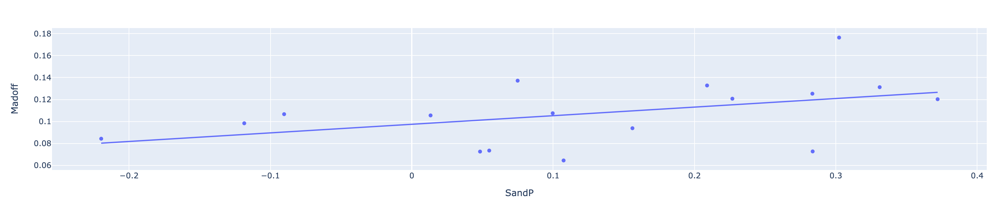

In [57]:
madoff_fig
Image(filename='./images/madoff.png', width=1500)

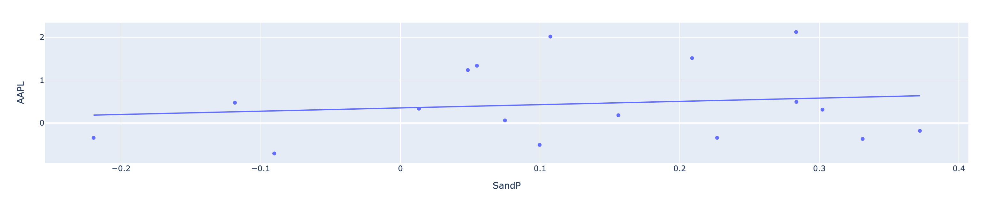

In [58]:
aapl_fig
Image(filename='./images/aapl.png', width=1500)

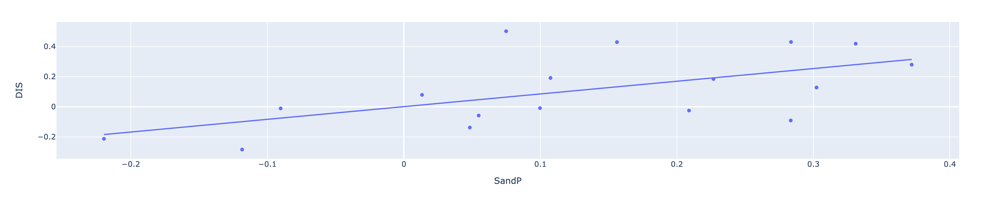

In [59]:
dis_fig
Image(filename='./images/dis.png', width=1500)

---
### Define the Treynor ratio function:

In [24]:
def treynor_ratio(df, stock_returns, market_index):
    form = stock_returns + " ~ " + market_index
    model = smf.ols(formula=form, data=df).fit()
    beta = model.params.loc[market_index]
    avg_returns = df[stock_returns].mean()
    print(f"The average yearly returns for {stock_returns} were: {round(avg_returns, 2)}")
    print(f"The Beta value for {stock_returns} is: {round(beta, 2)}")
    risk_free_return = 0.04
    
    treynor = (avg_returns - risk_free_return) / beta
    
    return print(f" The Treynor Ratio for {stock_returns} = {round(treynor, 2)}")

---
### Calculate the ratio for each stock/fund:

In [62]:
treynor_ratio(madoff_df, 'Madoff', 'SandP')

The average yearly returns for Madoff were: 0.11
The Beta value for Madoff is: 0.08
 The Treynor Ratio for Madoff = 0.86


In [63]:
treynor_ratio(madoff_df, 'AAPL', 'SandP')

The average yearly returns for AAPL were: 0.45
The Beta value for AAPL is: 0.76
 The Treynor Ratio for AAPL = 0.53


In [64]:
treynor_ratio(madoff_df, 'DIS', 'SandP')

The average yearly returns for DIS were: 0.11
The Beta value for DIS is: 0.84
 The Treynor Ratio for DIS = 0.08


---
### Observations:
As we can see from the table given below, the $\beta$ value for the Madoff fund was unusually low, meaning that compared to the rest of the market (and other stocks), Bernie Madoff's returns were not particularly sensitive to changes in the index tracking the market (S&P 500). In essence, what the ouput here says is that a 1% change in the market would have only cause the Madoff fund to move 0.08%, whereas for DIS and AAPL a similar change would have resulted in a 0.84% and a 0.76% change in the price of the stock, respectively. 

When comparing the Treynor ratio for the different stocks/fund, we can see Madoff pulling away with a ratio of 0.86, versus 0.53 and 0.8 respectively for AAPL and DIS. Even when the average yearly returns for his fund were well below that of AAPL, and the same as that of DIS.

In [50]:
betas = pd.DataFrame({'Fund/stock':['Madoff', 'AAPL', 'DIS'], 'avg yearly retunrs':[0.11, 0.45, 0.11],'Beta':[0.08, 0.76, 0.84], 'Treynor':[0.86, 0.53, 0.08]})
betas

,Fund/stock,avg yearly retunrs,Beta,Treynor
0,Madoff,0.11,0.08,0.86
1,AAPL,0.45,0.76,0.53
2,DIS,0.11,0.84,0.08


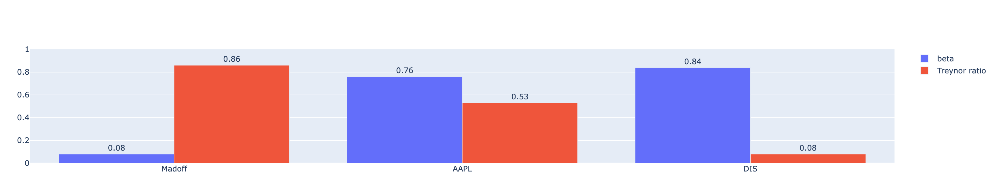

In [61]:
# build go figure by adding traces for each bar:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=betas["Fund/stock"],
    y=betas['Beta'],
    name='beta',
    text=betas['Beta']
))
fig.add_trace(go.Bar(
    x=betas["Fund/stock"],
    y=betas['Treynor'],
    name='Treynor ratio',
    text=betas['Treynor']
))
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_yaxes(range=[0,1])

Image(filename='./images/results.png', width=1600)

---